# 제품 이상여부 판별 프로젝트


## 1. 데이터 불러오기


### 필수 라이브러리


In [33]:
import os
from pprint import pprint

import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.model_selection import train_test_split
from tqdm import tqdm

### 데이터 읽어오기


In [34]:
ROOT_DIR = "data"
RANDOM_STATE = 110

# Load data
train_data = pd.read_csv(os.path.join(ROOT_DIR, "train.csv"))
train_data

,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,CURE END POSITION X Judge Value_Dam,...,Production Qty Collect Result_Fill2,Production Qty Unit Time_Fill2,Production Qty Judge Value_Fill2,Receip No Collect Result_Fill2,Receip No Unit Time_Fill2,Receip No Judge Value_Fill2,WorkMode Collect Result_Fill2,WorkMode Unit Time_Fill2,WorkMode Judge Value_Fill2,target
0,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,4F1XA938-1,1,OK,240.0,NaN,NaN,...,7,NaN,NaN,127,NaN,NaN,1,NaN,NaN,Normal
1,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,3KPM0016-2,1,OK,240.0,NaN,NaN,...,185,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
2,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1X9167-1,1,OK,1000.0,NaN,NaN,...,10,NaN,NaN,73,NaN,NaN,1,NaN,NaN,Normal
3,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3K1X0057-1,1,OK,1000.0,NaN,NaN,...,268,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
4,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3HPM0007-1,1,OK,240.0,NaN,NaN,...,121,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3J1XF434-2,1,OK,240.0,NaN,NaN,...,318,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
40502,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1XC796-1,1,OK,1000.0,NaN,NaN,...,14,NaN,NaN,197,NaN,NaN,1,NaN,NaN,Normal
40503,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,4C1XD438-1,1,OK,240.0,NaN,NaN,...,1,NaN,NaN,27,NaN,NaN,1,NaN,NaN,Normal
40504,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3I1XA258-1,1,OK,1000.0,NaN,NaN,...,117,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal


In [35]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40506 entries, 0 to 40505
Columns: 464 entries, Wip Line_Dam to target
dtypes: float64(350), int64(77), object(37)
memory usage: 143.4+ MB


In [36]:
train_data["target"].value_counts()

target
Normal      38156
AbNormal     2350
Name: count, dtype: int64

In [37]:
test_data = pd.read_csv(os.path.join(ROOT_DIR, "test.csv"))
test_data

,Set ID,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,...,Production Qty Collect Result_Fill2,Production Qty Unit Time_Fill2,Production Qty Judge Value_Fill2,Receip No Collect Result_Fill2,Receip No Unit Time_Fill2,Receip No Judge Value_Fill2,WorkMode Collect Result_Fill2,WorkMode Unit Time_Fill2,WorkMode Judge Value_Fill2,target
0,0001be084fbc4aaa9d921f39e595961b,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3J1XF767-1,1,OK,1000.0,NaN,...,195,NaN,NaN,1,NaN,NaN,0,NaN,NaN,NaN
1,0005bbd180064abd99e63f9ed3e1ac80,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4B1XD472-2,1,OK,1000.0,NaN,...,14,NaN,NaN,256,NaN,NaN,1,NaN,NaN,NaN
2,000948934c4140d883d670adcb609584,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3H1XE355-1,1,OK,240.0,NaN,...,98,NaN,NaN,1,NaN,NaN,0,NaN,NaN,NaN
3,000a6bfd02874c6296dc7b2e9c5678a7,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3L1XA128-1,1,OK,1000.0,NaN,...,14,NaN,NaN,0,NaN,NaN,1,NaN,NaN,NaN
4,0018e78ce91343678716e2ea27a51c95,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,4A1XA639-1,1,OK,240.0,NaN,...,1,NaN,NaN,215,NaN,NaN,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17356,ffea508b59934d689b540f95eb3fa730,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3K1XB597-1,1,OK,1000.0,NaN,...,14,NaN,NaN,131,NaN,NaN,1,NaN,NaN,NaN
17357,ffed8923c8a448a98afc641b770be153,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4A1XB974-1,1,OK,1000.0,NaN,...,12,NaN,NaN,279,NaN,NaN,1,NaN,NaN,NaN
17358,fff1e73734da40adbe805359b3efb462,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3L1XA998-1,1,OK,240.0,NaN,...,4,NaN,NaN,66,NaN,NaN,1,NaN,NaN,NaN
17359,fff8e38bdd09470baf95f71e92075dec,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3F1XC376-1,1,OK,240.0,NaN,...,117,NaN,NaN,1,NaN,NaN,0,NaN,NaN,NaN


In [38]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17361 entries, 0 to 17360
Columns: 465 entries, Set ID to target
dtypes: float64(351), int64(77), object(37)
memory usage: 61.6+ MB


In [39]:
# 'tt' 칼럼 추가
train_data['tt'] = 'train'
test_data['tt'] = 'test'

In [40]:
train_target = train_data['target']

testSet = test_data['Set ID']
test_target = test_data['target']

In [41]:
train_data = train_data.drop(columns = ['target'])

test_data = test_data.drop(columns=['Set ID', 'target'])

In [42]:
df = pd.concat([train_data, test_data], ignore_index=True)

In [43]:
df.describe()

,Insp. Seq No._Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,CURE END POSITION X Judge Value_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Z Unit Time_Dam,CURE END POSITION Z Judge Value_Dam,CURE END POSITION Θ Collect Result_Dam,CURE END POSITION Θ Unit Time_Dam,CURE END POSITION Θ Judge Value_Dam,...,PalletID Judge Value_Fill2,Production Qty Collect Result_Fill2,Production Qty Unit Time_Fill2,Production Qty Judge Value_Fill2,Receip No Collect Result_Fill2,Receip No Unit Time_Fill2,Receip No Judge Value_Fill2,WorkMode Collect Result_Fill2,WorkMode Unit Time_Fill2,WorkMode Judge Value_Fill2
count,57867.0,57867.000000,0.0,0.0,57867.000000,0.0,0.0,57867.000000,0.0,0.0,...,0.0,57867.000000,0.0,0.0,57867.000000,0.0,0.0,57867.000000,0.0,0.0
mean,1.0,530.291185,NaN,NaN,6.319621,NaN,NaN,-21.246825,NaN,NaN,...,NaN,73.378644,NaN,NaN,109.043565,NaN,NaN,0.770439,NaN,NaN
std,0.0,369.262352,NaN,NaN,4.858715,NaN,NaN,87.456873,NaN,NaN,...,NaN,105.008129,NaN,NaN,131.101183,NaN,NaN,1.275041,NaN,NaN
min,1.0,240.000000,NaN,NaN,2.500000,NaN,NaN,-90.000000,NaN,NaN,...,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN
25%,1.0,240.000000,NaN,NaN,2.500000,NaN,NaN,-90.000000,NaN,NaN,...,NaN,7.000000,NaN,NaN,1.000000,NaN,NaN,0.000000,NaN,NaN
50%,1.0,240.000000,NaN,NaN,2.500000,NaN,NaN,-90.000000,NaN,NaN,...,NaN,13.000000,NaN,NaN,49.000000,NaN,NaN,1.000000,NaN,NaN
75%,1.0,1000.000000,NaN,NaN,12.500000,NaN,NaN,90.000000,NaN,NaN,...,NaN,120.000000,NaN,NaN,197.000000,NaN,NaN,1.000000,NaN,NaN
max,1.0,1000.000000,NaN,NaN,12.500000,NaN,NaN,90.000000,NaN,NaN,...,NaN,487.000000,NaN,NaN,608.000000,NaN,NaN,17.000000,NaN,NaN


In [44]:
df.isnull().sum()

Wip Line_Dam                         0
Process Desc._Dam                    0
Equipment_Dam                        0
Model.Suffix_Dam                     0
Workorder_Dam                        0
                                 ...  
Receip No Judge Value_Fill2      57867
WorkMode Collect Result_Fill2        0
WorkMode Unit Time_Fill2         57867
WorkMode Judge Value_Fill2       57867
tt                                   0
Length: 464, dtype: int64

In [45]:
# 각 열별 결측치 개수 확인
missing_values_count = (df.isnull().sum())
missing_values_count = missing_values_count/df.shape[0] 
missing_values_ratio = missing_values_count * 100
print(missing_values_ratio)

Wip Line_Dam                       0.0
Process Desc._Dam                  0.0
Equipment_Dam                      0.0
Model.Suffix_Dam                   0.0
Workorder_Dam                      0.0
                                 ...  
Receip No Judge Value_Fill2      100.0
WorkMode Collect Result_Fill2      0.0
WorkMode Unit Time_Fill2         100.0
WorkMode Judge Value_Fill2       100.0
tt                                 0.0
Length: 464, dtype: float64


In [46]:
bins = [0, 20, 40, 60, 70, 80, 90,100]
missing_values_counts = pd.cut(missing_values_ratio, bins=bins).value_counts().sort_index()

print(missing_values_counts)

(0, 20]        0
(20, 40]       3
(40, 60]       0
(60, 70]       0
(70, 80]       5
(80, 90]       0
(90, 100]    278
Name: count, dtype: int64


In [47]:
# 결측치 비율이 90 이상인 열 삭제
threshold = 90
df= df.drop(columns=missing_values_ratio[missing_values_ratio >= threshold].index)

--

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57867 entries, 0 to 57866
Columns: 186 entries, Wip Line_Dam to tt
dtypes: float64(72), int64(77), object(37)
memory usage: 82.1+ MB


In [49]:
df.shape

(57867, 186)

In [50]:
from sklearn.preprocessing import LabelEncoder

# 범주형 열 확인, Workorder_Dam 제외
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_columns.remove('Workorder_Dam')  # 'Workorder_Dam' 제외

# LabelEncoder 객체 생성
label_encoders = {}

# 각 범주형 열에 대해 라벨 인코딩 적용
for column in categorical_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))
    label_encoders[column] = le  # 인코더 저장

print("라벨 인코딩이 완료되었습니다.")

라벨 인코딩이 완료되었습니다.


In [51]:
df

,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,...,Head Clean Position Z Collect Result_Fill2,Head Purge Position X Collect Result_Fill2,Head Purge Position Y Collect Result_Fill2,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2,tt
0,0,0,0,3,4F1XA938-1,1,0,240.0,2.5,-90,...,50.0,91.8,270,50,114.612,19.9,7,127,1,1
1,0,0,0,3,3KPM0016-2,1,0,240.0,2.5,-90,...,91.8,270.0,50,85,19.600,7.0,185,1,0,1
2,0,0,1,0,4E1X9167-1,1,0,1000.0,12.5,90,...,50.0,91.8,270,50,114.612,19.8,10,73,1,1
3,0,0,1,0,3K1X0057-1,1,0,1000.0,12.5,90,...,91.8,270.0,50,85,19.900,12.0,268,1,0,1
4,0,0,0,0,3HPM0007-1,1,0,240.0,2.5,-90,...,91.8,270.0,50,85,19.700,8.0,121,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,0,0,1,0,3K1XB597-1,1,0,1000.0,12.5,90,...,50.0,91.8,270,50,85.000,19.5,14,131,1,0
57863,0,0,1,0,4A1XB974-1,1,0,1000.0,12.5,90,...,50.0,91.8,270,50,85.000,19.8,12,279,1,0
57864,0,0,0,0,3L1XA998-1,1,0,240.0,2.5,-90,...,50.0,91.8,270,50,85.000,20.5,4,66,1,0
57865,0,0,0,0,3F1XC376-1,1,0,240.0,2.5,-90,...,91.8,270.0,50,85,18.900,1.0,117,1,0,0


In [52]:
# 1. 상수 열 식별
constant_columns = [col for col in df.columns if df[col].nunique() == 1]

# 2. 상수 열 개수와 이름 확인
print(f"Number of constant columns: {len(constant_columns)}")
print(f"Constant columns: {constant_columns}")

Number of constant columns: 35
Constant columns: ['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam', 'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam', 'CURE STANDBY POSITION Z Collect Result_Dam', 'CURE STANDBY POSITION Θ Collect Result_Dam', 'CURE START POSITION Z Collect Result_Dam', 'Wip Line_AutoClave', 'Process Desc._AutoClave', 'Equipment_AutoClave', 'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave', '1st Pressure Judge Value_AutoClave', '2nd Pressure Judge Value_AutoClave', '3rd Pressure Judge Value_AutoClave', 'Wip Line_Fill1', 'Process Desc._Fill1', 'Insp. Seq No._Fill1', 'Insp Judge Code_Fill1', 'Wip Line_Fill2', 'Process Desc._Fill2', 'Insp. Seq No._Fill2', 'Insp Judge Code_Fill2', 'CURE END POSITION Θ Collect Result_Fill2', 'CURE STANDBY POSITION X Collect Result_Fill2', 'CURE STANDBY POSITION Θ Collect Result_Fill2', 'CURE START POSITION Θ Collect Result_Fill2', 'DISCHARGED SPEED OF RESIN Collect Result_Fill2', 'DISCHARGED TIME OF RESIN(Stage

In [53]:
print(df['Wip Line_Dam'])

0        0
1        0
2        0
3        0
4        0
        ..
57862    0
57863    0
57864    0
57865    0
57866    0
Name: Wip Line_Dam, Length: 57867, dtype: int64


In [54]:
# 3. 상수 열 삭제
df.drop(columns=constant_columns, inplace=True)

# 4. 삭제된 열의 이름 반환
print(f"Deleted columns: {constant_columns}")

Deleted columns: ['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam', 'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam', 'CURE STANDBY POSITION Z Collect Result_Dam', 'CURE STANDBY POSITION Θ Collect Result_Dam', 'CURE START POSITION Z Collect Result_Dam', 'Wip Line_AutoClave', 'Process Desc._AutoClave', 'Equipment_AutoClave', 'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave', '1st Pressure Judge Value_AutoClave', '2nd Pressure Judge Value_AutoClave', '3rd Pressure Judge Value_AutoClave', 'Wip Line_Fill1', 'Process Desc._Fill1', 'Insp. Seq No._Fill1', 'Insp Judge Code_Fill1', 'Wip Line_Fill2', 'Process Desc._Fill2', 'Insp. Seq No._Fill2', 'Insp Judge Code_Fill2', 'CURE END POSITION Θ Collect Result_Fill2', 'CURE STANDBY POSITION X Collect Result_Fill2', 'CURE STANDBY POSITION Θ Collect Result_Fill2', 'CURE START POSITION Θ Collect Result_Fill2', 'DISCHARGED SPEED OF RESIN Collect Result_Fill2', 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill2', 'DISCH

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57867 entries, 0 to 57866
Columns: 151 entries, Equipment_Dam to tt
dtypes: float64(68), int64(82), object(1)
memory usage: 66.7+ MB


In [56]:
df.shape

(57867, 151)

In [57]:
# 숫자형 데이터만 선택
numeric_df = df.select_dtypes(include=[float, int])

# 상관관계 계산
correlation_matrix = numeric_df.corr()

# 상관관계 행렬 출력
print(correlation_matrix)

                                        Equipment_Dam  Model.Suffix_Dam  \
Equipment_Dam                                1.000000          0.071109   
Model.Suffix_Dam                             0.071109          1.000000   
CURE END POSITION X Collect Result_Dam       1.000000          0.071109   
CURE END POSITION Z Collect Result_Dam       1.000000          0.071109   
CURE END POSITION Θ Collect Result_Dam       1.000000          0.071109   
...                                               ...               ...   
PalletID Collect Result_Fill2                0.415403          0.214376   
Production Qty Collect Result_Fill2         -0.166167         -0.149576   
Receip No Collect Result_Fill2               0.188893          0.031646   
WorkMode Collect Result_Fill2                0.151136          0.227163   
tt                                           0.000329         -0.002871   

                                        CURE END POSITION X Collect Result_Dam  \
Equipment_Dam    

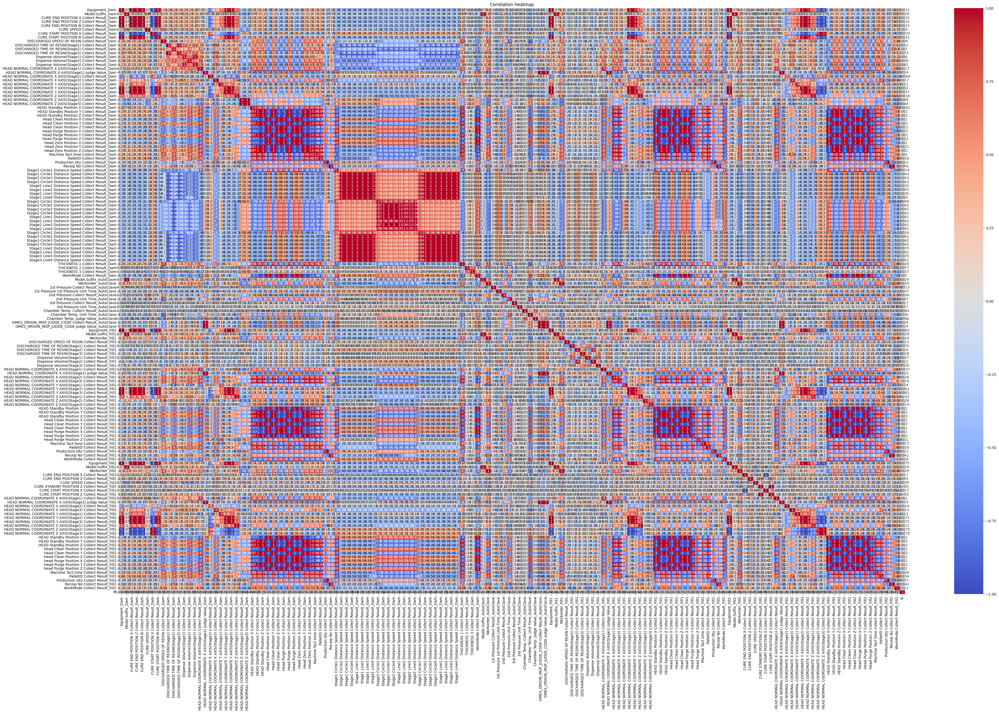

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(50, 30))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

In [59]:
# 상관관계 행렬의 절대값
corr_matrix = numeric_df.corr().abs()
# 상관관계가 1에 가까운 변수 식별
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 상관관계가 높은 변수 제거
threshold = 0.9
to_drop = [column for column in upper.columns if any(upper[column] >= threshold)]
numeric_df_drop = numeric_df.drop(columns=to_drop)

print("제거된 변수:", to_drop)
print(numeric_df_drop)

제거된 변수: ['CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'CURE START POSITION X Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam', 'HEAD Standby Position Y Collect Result_Dam', 'HEAD Standby Position Z Collect Result_Dam', 'Head Clean Position X Collect Result_Dam', 'Head Clean Position Y Collect Result_Dam', 'Head Clean Position Z Collect Result_Dam', 'Head Purge Position X Collect Result_Dam', 'Head Purge Position Y Collect Result_Dam', 'Head Purge Position Z Collect Result_Dam', 'Head Zero Position X Collect Result_Dam', 'Head Zero Position Y Collect Result_

In [60]:
numeric_df_drop.shape

(57867, 44)

In [61]:
numeric_df_drop

,Equipment_Dam,Model.Suffix_Dam,CURE SPEED Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,Dispense Volume(Stage1) Collect Result_Dam,Dispense Volume(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam,...,HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1,HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1,Head Purge Position Z Collect Result_Fill1,CURE END POSITION X Collect Result_Fill2,CURE END POSITION Z Collect Result_Fill2,CURE SPEED Collect Result_Fill2,CURE STANDBY POSITION Z Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2,WorkMode Collect Result_Fill2,tt
0,0,3,100,16,14.9,8.4,1.04,0.58,7,1,...,244.520,244.520,50,240,33,48,33,835.5,1,1
1,0,3,70,10,21.3,4.9,1.49,0.34,5,1,...,244.400,244.400,145,240,33,50,33,458.0,0,1
2,1,0,85,16,14.7,8.5,1.61,0.93,6,0,...,244.415,244.415,50,240,33,50,33,305.0,1,1
3,1,0,70,10,21.3,8.4,1.49,0.58,0,1,...,244.300,244.300,145,240,33,50,33,499.8,0,1
4,0,0,70,10,9.7,4.9,0.67,0.34,2,1,...,244.400,244.400,85,240,32,50,33,458.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,1,0,70,10,21.3,10.6,1.49,0.74,7,1,...,244.300,244.300,50,240,33,50,33,305.0,1,0
57863,1,0,70,16,13.2,7.6,0.92,0.53,6,0,...,244.505,244.505,50,240,33,50,33,305.0,1,0
57864,0,0,70,16,13.2,6.6,1.45,0.72,7,1,...,244.400,244.400,50,240,33,50,33,835.5,1,0
57865,0,0,70,10,9.7,3.9,0.67,0.27,2,1,...,244.300,244.300,85,240,32,51,22,458.0,0,0


In [66]:
from sklearn.preprocessing import RobustScaler

# 1. 수치형 데이터와 범주형 데이터를 결합하여 원래 데이터프레임 복구
# numeric_df_drop은 상관관계가 높은 수치형 변수가 제거된 상태입니다.
# df에서 수치형 변수 제외하고, 범주형 변수만 선택
categorical_df = df.select_dtypes(include=['object', 'category'])

# numeric_df_drop과 categorical_df 결합하여 원래 형태로 복구
df_combined = pd.concat([numeric_df_drop, categorical_df], axis=1)

# 2. 정규화를 위해 수치형 데이터만 분리
numeric_features = df_combined.select_dtypes(include=[float, int])
categorical_features = df_combined.select_dtypes(include=['object', 'category'])

# 3. 정규화 수행 (RobustScaler 사용)
scaler = RobustScaler()
numeric_features_scaled = pd.DataFrame(scaler.fit_transform(numeric_features), columns=numeric_features.columns)

# 정규화된 수치형 데이터와 범주형 데이터를 다시 결합하여 최종 데이터프레임 생성
df_normalized = pd.concat([numeric_features_scaled, categorical_features.reset_index(drop=True)], axis=1)

print("정규화가 완료된 데이터프레임:")
print(df_normalized)


정규화가 완료된 데이터프레임:
       Equipment_Dam  Model.Suffix_Dam  CURE SPEED Collect Result_Dam  \
0                0.0               3.0                           30.0   
1                0.0               3.0                            0.0   
2                1.0               0.0                           15.0   
3                1.0               0.0                            0.0   
4                0.0               0.0                            0.0   
...              ...               ...                            ...   
57862            1.0               0.0                            0.0   
57863            1.0               0.0                            0.0   
57864            0.0               0.0                            0.0   
57865            0.0               0.0                            0.0   
57866            0.0               0.0                            0.0   

       DISCHARGED SPEED OF RESIN Collect Result_Dam  \
0                                               1.0

In [67]:
df_normalized

,Equipment_Dam,Model.Suffix_Dam,CURE SPEED Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,Dispense Volume(Stage1) Collect Result_Dam,Dispense Volume(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam,...,HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1,Head Purge Position Z Collect Result_Fill1,CURE END POSITION X Collect Result_Fill2,CURE END POSITION Z Collect Result_Fill2,CURE SPEED Collect Result_Fill2,CURE STANDBY POSITION Z Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2,WorkMode Collect Result_Fill2,tt,Workorder_Dam
0,0.0,3.0,30.0,1.0,0.435897,0.485714,0.092593,0.135135,0.2,0.0,...,0.631579,0.000000,0.0,0.0,-2.0,0.0,0.711593,0.0,0.0,4F1XA938-1
1,0.0,3.0,0.0,0.0,2.076923,-0.514286,0.925926,-0.513514,-0.2,0.0,...,0.000000,2.714286,0.0,0.0,0.0,0.0,0.000000,-1.0,0.0,3KPM0016-2
2,1.0,0.0,15.0,1.0,0.384615,0.514286,1.148148,1.081081,0.0,-1.0,...,0.078947,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,0.0,4E1X9167-1
3,1.0,0.0,0.0,0.0,2.076923,0.485714,0.925926,0.135135,-1.2,0.0,...,-0.526316,2.714286,0.0,0.0,0.0,0.0,0.078794,-1.0,0.0,3K1X0057-1
4,0.0,0.0,0.0,0.0,-0.897436,-0.514286,-0.592593,-0.513514,-0.8,0.0,...,0.000000,1.000000,0.0,-1.0,0.0,0.0,0.000000,-1.0,0.0,3HPM0007-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,1.0,0.0,0.0,0.0,2.076923,1.114286,0.925926,0.567568,0.2,0.0,...,-0.526316,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,-1.0,3K1XB597-1
57863,1.0,0.0,0.0,1.0,0.000000,0.257143,-0.129630,0.000000,0.0,-1.0,...,0.552632,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,-1.0,4A1XB974-1
57864,0.0,0.0,0.0,1.0,0.000000,-0.028571,0.851852,0.513514,0.2,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.711593,0.0,-1.0,3L1XA998-1
57865,0.0,0.0,0.0,0.0,-0.897436,-0.800000,-0.592593,-0.702703,-0.8,0.0,...,-0.526316,1.000000,0.0,-1.0,1.0,-11.0,0.000000,-1.0,-1.0,3F1XC376-1


In [68]:
# 범주형 데이터 열 확인
categorical_df = df_normalized.select_dtypes(include=['object', 'category'])
categorical_columns = df_normalized.select_dtypes(include=['object', 'category']).columns

# 범주형 데이터 열 개수 출력
num_categorical_columns = len(categorical_columns)
print(f"Number of categorical columns: {num_categorical_columns}")
print(f"Categorical columns: {categorical_columns.tolist()}")

Number of categorical columns: 1
Categorical columns: ['Workorder_Dam']


In [80]:
categorical_df['Workorder_Dam']

0        4F1XA938-1
1        3KPM0016-2
2        4E1X9167-1
3        3K1X0057-1
4        3HPM0007-1
            ...    
57862    3K1XB597-1
57863    4A1XB974-1
57864    3L1XA998-1
57865    3F1XC376-1
57866    3J1XC756-1
Name: Workorder_Dam, Length: 57867, dtype: object

In [79]:
# 새로운 칼럼을 추가하는 함수 정의
def split_workorder_column(df, column_name):
    # 각 파트를 분리하여 별도의 데이터프레임으로 생성
    split_df = pd.DataFrame()
    split_df[f'{column_name}_part1'] = df[column_name].str[0:4]
    split_df[f'{column_name}_part2'] = df[column_name].str[4:9]
    split_df[f'{column_name}_part3'] = df[column_name].str[9]
    
    # 원래 데이터프레임과 분리된 데이터프레임을 concat으로 한 번에 결합
    df = pd.concat([df, split_df], axis=1)
    return df

# 'Workorder_Dam' 칼럼을 나누어 새로운 칼럼을 추가
df = split_workorder_column(df, 'Workorder_Dam')

# 결과 확인
print(df[['Workorder_Dam', 'Workorder_Dam_part1', 'Workorder_Dam_part2', 'Workorder_Dam_part3']].head())

  Workorder_Dam Workorder_Dam_part1 Workorder_Dam_part1 Workorder_Dam_part1  \
0    4F1XA938-1                4F1X                4F1X                4F1X   
1    3KPM0016-2                3KPM                3KPM                3KPM   
2    4E1X9167-1                4E1X                4E1X                4E1X   
3    3K1X0057-1                3K1X                3K1X                3K1X   
4    3HPM0007-1                3HPM                3HPM                3HPM   

  Workorder_Dam_part2 Workorder_Dam_part2 Workorder_Dam_part2  \
0               A938-               A938-               A938-   
1               0016-               0016-               0016-   
2               9167-               9167-               9167-   
3               0057-               0057-               0057-   
4               0007-               0007-               0007-   

  Workorder_Dam_part3 Workorder_Dam_part3 Workorder_Dam_part3  
0                   1                   1                   1  
1     

In [91]:
df

,Equipment_Dam,Model.Suffix_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,CURE SPEED Collect Result_Dam,CURE START POSITION X Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,...,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2,tt,Workorder_Dam_part1,Workorder_Dam_part2,Workorder_Dam_part3
0,0.0,3.0,0.0,0.0,0.0,30.0,0.0,1.0,0.435897,0.485714,...,0.0,0.452783,0.030769,-0.053097,0.397959,0.0,0.0,1.4,-0.160584,0.0
1,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.076923,-0.514286,...,1.0,-1.000000,-0.961538,1.522124,-0.244898,-1.0,0.0,-0.2,-0.916058,1.0
2,1.0,0.0,1.0,1.0,1.0,15.0,-1.0,1.0,0.384615,0.514286,...,0.0,0.452783,0.023077,-0.026549,0.122449,0.0,0.0,1.2,-0.583942,0.0
3,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,0.0,2.076923,0.485714,...,1.0,-0.995413,-0.576923,2.256637,-0.244898,-1.0,0.0,-0.3,-0.883212,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.897436,-0.514286,...,1.0,-0.998471,-0.884615,0.955752,-0.244898,-1.0,0.0,-0.8,-0.923358,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,0.0,2.076923,1.114286,...,0.0,0.000000,0.000000,0.008850,0.418367,0.0,-1.0,-0.3,0.069343,0.0
57863,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,1.0,0.000000,0.257143,...,0.0,0.000000,0.023077,-0.008850,1.173469,0.0,-1.0,0.4,0.175182,0.0
57864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,-0.028571,...,0.0,0.000000,0.076923,-0.079646,0.086735,0.0,-1.0,0.0,-0.142336,0.0
57865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.897436,-0.800000,...,1.0,-1.010703,-1.423077,0.920354,-0.244898,-1.0,-1.0,-1.4,0.291971,0.0


In [82]:
df.

,Equipment_Dam,Model.Suffix_Dam,CURE SPEED Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,Dispense Volume(Stage1) Collect Result_Dam,Dispense Volume(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam,...,HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1,Head Purge Position Z Collect Result_Fill1,CURE END POSITION X Collect Result_Fill2,CURE END POSITION Z Collect Result_Fill2,CURE SPEED Collect Result_Fill2,CURE STANDBY POSITION Z Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2,WorkMode Collect Result_Fill2,tt,Workorder_Dam
0,0.0,3.0,30.0,1.0,0.435897,0.485714,0.092593,0.135135,0.2,0.0,...,0.631579,0.000000,0.0,0.0,-2.0,0.0,0.711593,0.0,0.0,4F1XA938-1
1,0.0,3.0,0.0,0.0,2.076923,-0.514286,0.925926,-0.513514,-0.2,0.0,...,0.000000,2.714286,0.0,0.0,0.0,0.0,0.000000,-1.0,0.0,3KPM0016-2
2,1.0,0.0,15.0,1.0,0.384615,0.514286,1.148148,1.081081,0.0,-1.0,...,0.078947,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,0.0,4E1X9167-1
3,1.0,0.0,0.0,0.0,2.076923,0.485714,0.925926,0.135135,-1.2,0.0,...,-0.526316,2.714286,0.0,0.0,0.0,0.0,0.078794,-1.0,0.0,3K1X0057-1
4,0.0,0.0,0.0,0.0,-0.897436,-0.514286,-0.592593,-0.513514,-0.8,0.0,...,0.000000,1.000000,0.0,-1.0,0.0,0.0,0.000000,-1.0,0.0,3HPM0007-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,1.0,0.0,0.0,0.0,2.076923,1.114286,0.925926,0.567568,0.2,0.0,...,-0.526316,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,-1.0,3K1XB597-1
57863,1.0,0.0,0.0,1.0,0.000000,0.257143,-0.129630,0.000000,0.0,-1.0,...,0.552632,0.000000,0.0,0.0,0.0,0.0,-0.288407,0.0,-1.0,4A1XB974-1
57864,0.0,0.0,0.0,1.0,0.000000,-0.028571,0.851852,0.513514,0.2,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.711593,0.0,-1.0,3L1XA998-1
57865,0.0,0.0,0.0,0.0,-0.897436,-0.800000,-0.592593,-0.702703,-0.8,0.0,...,-0.526316,1.000000,0.0,-1.0,1.0,-11.0,0.000000,-1.0,-1.0,3F1XC376-1


In [87]:
#이제 필요없는 Workorder_Dam 칼럼 삭제
df = df.drop(columns=['Workorder_Dam'])

In [89]:
# 범주형 데이터 열 확인
categorical_df = df.select_dtypes(include=['object', 'category'])
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

# 범주형 데이터 열 개수 출력
num_categorical_columns = len(categorical_columns)
print(f"Number of categorical columns: {num_categorical_columns}")
print(f"Categorical columns: {categorical_columns.tolist()}")

Number of categorical columns: 3
Categorical columns: ['Workorder_Dam_part1', 'Workorder_Dam_part2', 'Workorder_Dam_part3']


In [90]:
# 1. 범주형 데이터 인코딩
# 범주형 열 선택
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

# LabelEncoder를 사용하여 범주형 데이터 인코딩
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le  # 각 열의 인코더 저장

# 2. 수치형 데이터 정규화 (RobustScaler 사용)
# 수치형 열 선택
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# RobustScaler를 사용하여 수치형 데이터 정규화
scaler = RobustScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# 결과 확인
print("인코딩 및 정규화가 완료된 데이터프레임:")
print(df.head())


인코딩 및 정규화가 완료된 데이터프레임:
   Equipment_Dam  Model.Suffix_Dam  CURE END POSITION X Collect Result_Dam  \
0            0.0               3.0                                     0.0   
1            0.0               3.0                                     0.0   
2            1.0               0.0                                     1.0   
3            1.0               0.0                                     1.0   
4            0.0               0.0                                     0.0   

   CURE END POSITION Z Collect Result_Dam  \
0                                     0.0   
1                                     0.0   
2                                     1.0   
3                                     1.0   
4                                     0.0   

   CURE END POSITION Θ Collect Result_Dam  CURE SPEED Collect Result_Dam  \
0                                     0.0                           30.0   
1                                     0.0                            0.0   
2        

여기서부터 상현이형 코드 참고

In [92]:
df['tt']

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
57862   -1.0
57863   -1.0
57864   -1.0
57865   -1.0
57866   -1.0
Name: tt, Length: 57867, dtype: float64

In [95]:
import pandas as pd

# 'tt' 칼럼을 기준으로 train과 test로 다시 분리
train = df[df['tt'] == 0.0].copy()
test = df[df['tt'] == -1.0].copy()

# 'tt' 칼럼은 이제 필요 없으므로 삭제
train.drop(columns=['tt'], inplace=True)
test.drop(columns=['tt'], inplace=True)

# train 데이터에 원래 target 값 추가
train['target'] = train_target.values

# test 데이터에 NaN으로 채워진 target 칼럼 추가
test['target'] = float('nan')

# 결과 확인
print("Train data shape:", train.shape)
print("Test data shape:", test.shape)
print(train.head())
print(test.head())

Train data shape: (40506, 128)
Test data shape: (17361, 128)
   Equipment_Dam  Model.Suffix_Dam  CURE END POSITION X Collect Result_Dam  \
0            0.0               3.0                                     0.0   
1            0.0               3.0                                     0.0   
2            1.0               0.0                                     1.0   
3            1.0               0.0                                     1.0   
4            0.0               0.0                                     0.0   

   CURE END POSITION Z Collect Result_Dam  \
0                                     0.0   
1                                     0.0   
2                                     1.0   
3                                     1.0   
4                                     0.0   

   CURE END POSITION Θ Collect Result_Dam  CURE SPEED Collect Result_Dam  \
0                                     0.0                           30.0   
1                                     0.0      

In [96]:
train['target'] 

0          Normal
1          Normal
2          Normal
3          Normal
4          Normal
           ...   
40501      Normal
40502      Normal
40503      Normal
40504      Normal
40505    AbNormal
Name: target, Length: 40506, dtype: object

In [98]:
# 각 클래스의 샘플 수 계산
normal_count = train[train['target'] == 'Normal'].shape[0]
abnormal_count = train[train['target'] == 'AbNormal'].shape[0]

# 총 샘플 수 계산
total_count = normal_count + abnormal_count

# 클래스 비율 계산
normal_ratio = normal_count / total_count
abnormal_ratio = abnormal_count / total_count

# 결과 출력
print(f"Normal 샘플 수: {normal_count}, AbNormal 샘플 수: {abnormal_count}")
print(f"Normal 비율: {normal_ratio:.2f}, AbNormal 비율: {abnormal_ratio:.2f}")

Normal 샘플 수: 38156, AbNormal 샘플 수: 2350
Normal 비율: 0.94, AbNormal 비율: 0.06


In [99]:
import pandas as pd

# 다운샘플링 비율 설정
normal_ratio = 2.0  # 'AbNormal' 클래스의 샘플 수의 2배

# 'Normal'과 'AbNormal' 클래스로 데이터 분리
df_normal = train[train['target'] == 'Normal']
df_abnormal = train[train['target'] == 'AbNormal']

print(f" Total: Normal: {len(df_normal)}, AbNormal: {len(df_abnormal)}")

# 'Normal' 클래스를 2:1 비율로 다운샘플링
df_normal = df_normal.sample(n=int(len(df_abnormal) * normal_ratio), replace=False, random_state=RANDOM_STATE)

# 각 클래스의 'target' 칼럼을 문자열로 변환
df_abnormal.loc[:, 'target'] = df_abnormal['target'].astype(str)
df_normal.loc[:, 'target'] = df_normal['target'].astype(str)

# 다운샘플링된 'Normal'과 원래 'AbNormal' 클래스를 결합하여 균형 잡힌 데이터프레임 생성
train_df = pd.concat([df_normal, df_abnormal], axis=0).reset_index(drop=True)

# 결과 확인
print(train_df['target'].value_counts())

 Total: Normal: 38156, AbNormal: 2350
target
Normal      4700
AbNormal    2350
Name: count, dtype: int64


In [100]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score

# Train 데이터를 학습과 검증 세트로 분리
X = train.drop(columns=['target'])  # 입력 피처
y = train['target']  # 타겟 변수

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# CatBoostClassifier 모델 생성
model = CatBoostClassifier(random_state=42, verbose=100, eval_metric='F1')

# 범주형 피처 인덱스 설정 (CatBoost가 자동으로 처리할 수 있음)
cat_features = X_train.select_dtypes(include=['object']).columns.tolist()

# 모델 학습
model.fit(X_train, y_train, cat_features=cat_features, eval_set=(X_val, y_val), early_stopping_rounds=50)

# 검증 세트에 대한 예측
y_pred = model.predict(X_val)

# 모델 성능 평가
print("Classification Report:\n", classification_report(y_val, y_pred))
print("F1 Score:", f1_score(y_val, y_pred, average='weighted'))

Learning rate set to 0.074822
0:	learn: 0.9703600	test: 0.9712834	best: 0.9712834 (0)	total: 83.7ms	remaining: 1m 23s
100:	learn: 0.9712976	test: 0.9720244	best: 0.9720244 (79)	total: 1.4s	remaining: 12.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.9721480351
bestIteration = 118

Shrink model to first 119 iterations.
Classification Report:
               precision    recall  f1-score   support

    AbNormal       1.00      0.04      0.08       458
      Normal       0.95      1.00      0.97      7644

    accuracy                           0.95      8102
   macro avg       0.97      0.52      0.53      8102
weighted avg       0.95      0.95      0.92      8102

F1 Score: 0.9219237151500239


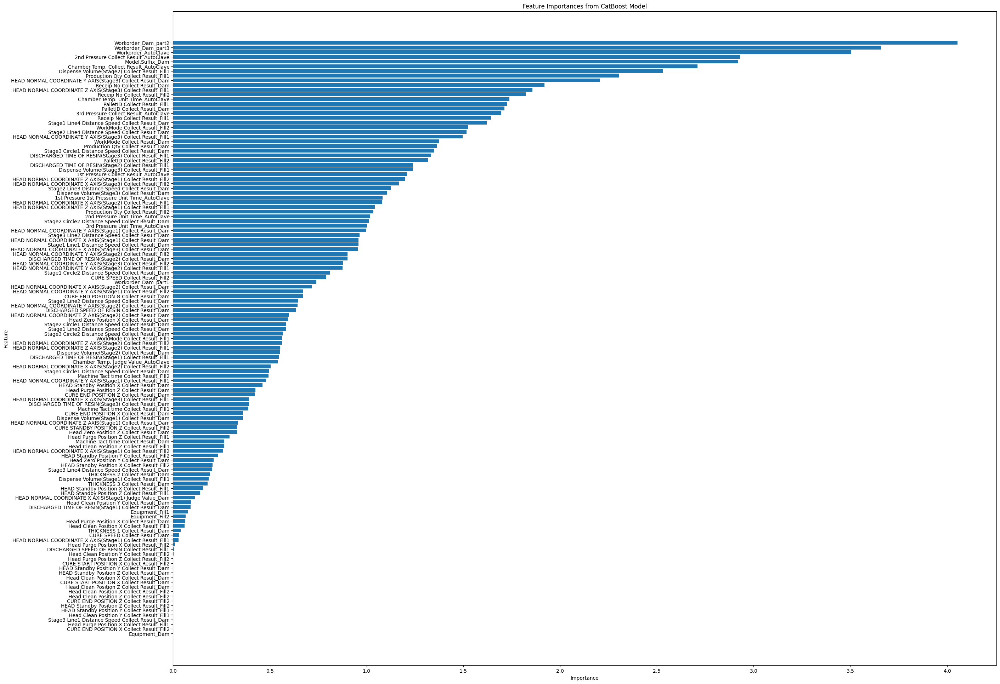

In [103]:
# 피처 중요도 계산
feature_importances = model.get_feature_importance()
feature_names = X_train.columns

# 피처 중요도를 데이터프레임으로 정리
feature_importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# 중요도에 따라 내림차순 정렬
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# 피처 중요도 시각화
plt.figure(figsize=(30, 24))
plt.barh(feature_importances_df['Feature'], feature_importances_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from CatBoost Model')
plt.gca().invert_yaxis()  # 상위 중요도를 위로 정렬
plt.show()

In [104]:
test_pred = model.predict(test)

In [105]:
test_pred

array(['Normal', 'Normal', 'Normal', ..., 'Normal', 'Normal', 'Normal'],
      dtype=object)

In [107]:
# 제출 데이터 읽어오기 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")
df_sub["target"] = test_pred

# 제출 파일 저장
df_sub.to_csv("submission.csv", index=False)

In [108]:
test

,Equipment_Dam,Model.Suffix_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,CURE SPEED Collect Result_Dam,CURE START POSITION X Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,...,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2,Workorder_Dam_part1,Workorder_Dam_part2,Workorder_Dam_part3,target
40506,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,0.0,0.974359,-0.514286,...,1.0,-0.996942,-0.500000,1.610619,-0.244898,-1.0,-0.5,0.864964,0.0,NaN
40507,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,1.0,0.256410,0.457143,...,0.0,0.000000,0.023077,0.008850,1.056122,0.0,0.6,0.572993,1.0,NaN
40508,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.897436,-0.514286,...,1.0,-0.998471,-1.423077,0.752212,-0.244898,-1.0,-0.9,0.697080,0.0,NaN
40509,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,0.0,2.076923,1.114286,...,0.0,0.000000,0.038462,0.008850,-0.250000,0.0,0.0,-0.416058,0.0,NaN
40510,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.228571,...,0.0,0.000000,0.023077,-0.106195,0.846939,0.0,0.4,-0.248175,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57862,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,0.0,2.076923,1.114286,...,0.0,0.000000,0.000000,0.008850,0.418367,0.0,-0.3,0.069343,0.0,NaN
57863,1.0,0.0,1.0,1.0,1.0,0.0,-1.0,1.0,0.000000,0.257143,...,0.0,0.000000,0.023077,-0.008850,1.173469,0.0,0.4,0.175182,0.0,NaN
57864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,-0.028571,...,0.0,0.000000,0.076923,-0.079646,0.086735,0.0,0.0,-0.142336,0.0,NaN
57865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.897436,-0.800000,...,1.0,-1.010703,-1.423077,0.920354,-0.244898,-1.0,-1.4,0.291971,0.0,NaN
